<a href="https://colab.research.google.com/github/DhanushN2005/Demographic-analysis-for-uidai-data/blob/main/Demographic_analyssi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Core
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Utilities
import zipfile
import os

# Settings
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10,5)


In [ ]:
ZIP_PATH = "/content/api_data_aadhar_demographic.zip"
EXTRACT_DIR = "aadhar_data"

# Extract zip
with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_DIR)

# List CSV files
csv_files = []
for root, _, files in os.walk(EXTRACT_DIR):
    for f in files:
        if f.endswith(".csv"):
            csv_files.append(os.path.join(root, f))

print("CSV files found:", len(csv_files))

# Load & concatenate
dfs = []
for file in csv_files:
    dfs.append(pd.read_csv(file))

df = pd.concat(dfs, ignore_index=True)
print("Final dataset shape:", df.shape)


CSV files found: 5
Final dataset shape: (2071700, 6)


In [ ]:
df.head()


,date,state,district,pincode,demo_age_5_17,demo_age_17_
0,18-11-2025,Karnataka,Hasan,573118,0,2
1,18-11-2025,Karnataka,Hasan,573124,1,3
2,18-11-2025,Karnataka,Hasan,573150,0,2
3,18-11-2025,Karnataka,Hassan,573113,0,1
4,18-11-2025,Karnataka,Hassan,573120,1,4


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2071700 entries, 0 to 2071699
Data columns (total 6 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   date           object
 1   state          object
 2   district       object
 3   pincode        int64 
 4   demo_age_5_17  int64 
 5   demo_age_17_   int64 
dtypes: int64(3), object(3)
memory usage: 94.8+ MB


In [ ]:
df.describe(include="all").T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
date,2071700,95,12-12-2025,34568,NaN,NaN,NaN,NaN,NaN,NaN,NaN
state,2071700,65,Andhra Pradesh,207687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
district,2071700,983,North 24 Parganas,12994,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pincode,2071700.0,NaN,NaN,NaN,527831.782277,197293.323331,100000.0,396469.0,524322.0,695507.0,855456.0
demo_age_5_17,2071700.0,NaN,NaN,NaN,2.347552,14.903554,0.0,0.0,1.0,2.0,2690.0
demo_age_17_,2071700.0,NaN,NaN,NaN,21.447006,125.249766,0.0,2.0,6.0,15.0,16166.0


In [ ]:
# Standardize column names
df.columns = df.columns.str.lower().str.replace(" ", "_")

# Check missing values
missing = df.isna().sum().sort_values(ascending=False)
missing


,0
date,0
state,0
district,0
pincode,0
demo_age_5_17,0
demo_age_17_,0


In [ ]:
# Drop completely empty rows (if any)
df = df.dropna(how="all")

# Fill minor nulls if present
df.fillna("Unknown", inplace=True)

print("After cleaning:", df.shape)


After cleaning: (2071700, 6)


In [ ]:
df.columns


Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17',
       'demo_age_17_'],
      dtype='object')

In [ ]:
df.columns = df.columns.str.lower()

df['date'] = pd.to_datetime(df['date'], errors='coerce')

num_cols = ['demo_age_5_17', 'demo_age_17_']
df[num_cols] = df[num_cols].apply(pd.to_numeric, errors='coerce')

df.fillna(0, inplace=True)

df.info()


/tmp/ipython-input-637610290.py:3: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['date'] = pd.to_datetime(df['date'], errors='coerce')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2071700 entries, 0 to 2071699
Data columns (total 6 columns):
 #   Column         Dtype         
---  ------         -----         
 0   date           datetime64[ns]
 1   state          object        
 2   district       object        
 3   pincode        int64         
 4   demo_age_5_17  int64         
 5   demo_age_17_   int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 94.8+ MB


In [ ]:
# Total Aadhaar count per row
df['total_population'] = df['demo_age_5_17'] + df['demo_age_17_']

# Percentage share
df['pct_5_17'] = (df['demo_age_5_17'] / df['total_population']) * 100
df['pct_17_plus'] = (df['demo_age_17_'] / df['total_population']) * 100

df.head()


,date,state,district,pincode,demo_age_5_17,demo_age_17_,total_population,pct_5_17,pct_17_plus
0,2025-11-18,Karnataka,Hasan,573118,0,2,2,0.0,100.0
1,2025-11-18,Karnataka,Hasan,573124,1,3,4,25.0,75.0
2,2025-11-18,Karnataka,Hasan,573150,0,2,2,0.0,100.0
3,2025-11-18,Karnataka,Hassan,573113,0,1,1,0.0,100.0
4,2025-11-18,Karnataka,Hassan,573120,1,4,5,20.0,80.0


In [ ]:
print("📊 UIDAI DASHBOARD METRICS")

print("Total Records:", len(df))
print("States Covered:", df['state'].nunique())
print("Districts Covered:", df['district'].nunique())

print("Total Aadhaar (5–17):", int(df['demo_age_5_17'].sum()))
print("Total Aadhaar (17+):", int(df['demo_age_17_'].sum()))


📊 UIDAI DASHBOARD METRICS
Total Records: 2071700
States Covered: 65
Districts Covered: 983
Total Aadhaar (5–17): 4863424
Total Aadhaar (17+): 44431763


In [ ]:
state_agg = df.groupby('state')[num_cols].sum().reset_index()

px.bar(
    state_agg.sort_values('demo_age_17_', ascending=False).head(10),
    x='state',
    y=['demo_age_5_17', 'demo_age_17_'],
    title="Top 10 States: Aadhaar Age-wise Distribution",
    barmode='stack'
)


In [ ]:
px.box(
    df,
    y='pct_5_17',
    title="Distribution of % Aadhaar Holders (Age 5–17) Across India"
)


In [ ]:
time_trend = (
    df.groupby(df['date'].dt.to_period("M"))[num_cols]
    .sum()
    .reset_index()
)

time_trend['date'] = time_trend['date'].astype(str)

px.line(
    time_trend,
    x='date',
    y=num_cols,
    title="Monthly Aadhaar Enrolment Trend by Age Group"
)


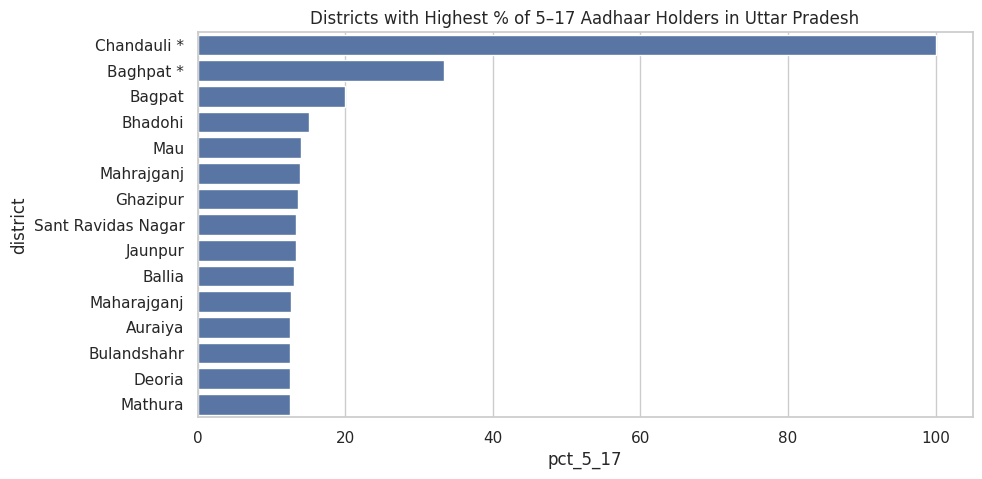

In [ ]:
district_agg = df.groupby(['state','district'])['pct_5_17'].mean().reset_index()

top_state = district_agg['state'].value_counts().idxmax()

top_districts = district_agg[district_agg['state']==top_state].sort_values(
    'pct_5_17', ascending=False
).head(15)

sns.barplot(
    x='pct_5_17',
    y='district',
    data=top_districts
)
plt.title(f"Districts with Highest % of 5–17 Aadhaar Holders in {top_state}")
plt.show()


In [ ]:
pincode_skew = df.groupby('pincode')['pct_5_17'].mean().reset_index()

px.histogram(
    pincode_skew,
    x='pct_5_17',
    nbins=40,
    title="Pincode-level Distribution of Aadhaar (Age 5–17)"
)


In [ ]:
insights = [
    "Majority Aadhaar holders belong to 17+ age group across all states",
    "Certain districts show disproportionately high 5–17 enrolment",
    "Strong regional variation exists at pincode level",
    "Temporal trends indicate consistent growth rather than spikes",
    "Data can guide targeted child enrolment & update campaigns"
]

for i, ins in enumerate(insights, 1):
    print(f"{i}. {ins}")


1. Majority Aadhaar holders belong to 17+ age group across all states
2. Certain districts show disproportionately high 5–17 enrolment
3. Strong regional variation exists at pincode level
4. Temporal trends indicate consistent growth rather than spikes
5. Data can guide targeted child enrolment & update campaigns


In [ ]:
!pip install streamlit plotly



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 108.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 83.3 MB/s eta 0:00:00


In [ ]:
# ==========================================================
# UIDAI HACKATHON 2026 – ONE TAB ANALYTICAL DASHBOARD
# Stable | Scalable | Policy-Grade
# ==========================================================

import streamlit as st
import pandas as pd
import plotly.express as px
import zipfile, os

st.set_page_config(page_title="UIDAI Demographic Dashboard", layout="wide")

st.title("🇮🇳 UIDAI Aadhaar Demographic Intelligence Dashboard")
st.caption("One-Tab | Statistical & Policy-Ready | Hackathon Phase-1")

ZIP_PATH = "/content/api_data_aadhar_demographic.zip"
EXTRACT_DIR = "/content/aadhar_data"

# ----------------------------------------------------------
# DATA LOADING (LIGHT + SAFE)
# ----------------------------------------------------------
@st.cache_data(show_spinner=True)
def load_and_prepare():
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall(EXTRACT_DIR)

    csvs = []
    for r, _, f in os.walk(EXTRACT_DIR):
        for x in f:
            if x.endswith(".csv"):
                csvs.append(os.path.join(r, x))

    df = pd.concat(
        [pd.read_csv(c, usecols=[
            'date','state','district','pincode',
            'demo_age_5_17','demo_age_17_'
        ]) for c in csvs],
        ignore_index=True
    )

    df['date'] = pd.to_datetime(df['date'], errors='coerce')
    df['total_population'] = df['demo_age_5_17'] + df['demo_age_17_']

    return df

df = load_and_prepare()

# ----------------------------------------------------------
# FILTERS
# ----------------------------------------------------------
st.sidebar.header("🔍 Filters")

state = st.sidebar.selectbox(
    "State",
    ['All'] + sorted(df['state'].unique())
)

if state != 'All':
    df = df[df['state'] == state]

# ----------------------------------------------------------
# KPIs (FAST)
# ----------------------------------------------------------
c1, c2, c3, c4 = st.columns(4)
c1.metric("Records", f"{len(df):,}")
c2.metric("States", df['state'].nunique())
c3.metric("Districts", df['district'].nunique())
c4.metric("Total Aadhaar", f"{int(df['total_population'].sum()):,}")

st.divider()

# ----------------------------------------------------------
# 1️⃣ CHILD ENROLMENT GAP (AGGREGATED)
# ----------------------------------------------------------
st.subheader("📉 Child Enrolment Gap Index")

national_child_pct = (
    df['demo_age_5_17'].sum() /
    df['total_population'].sum()
) * 100

district_gap = (
    df.groupby('district', as_index=False)
      .agg({'demo_age_5_17':'sum','total_population':'sum'})
)

district_gap['child_pct'] = (
    district_gap['demo_age_5_17'] /
    district_gap['total_population']
) * 100

district_gap['gap_index'] = (
    district_gap['child_pct'] - national_child_pct
)

fig1 = px.bar(
    district_gap.sort_values('gap_index').head(15),
    x='gap_index', y='district',
    orientation='h',
    title="Bottom 15 Districts (Child Enrolment Gap)"
)

st.plotly_chart(fig1, use_container_width=True)

# ----------------------------------------------------------
# 2️⃣ PINCODE VOLATILITY (REDUCED)
# ----------------------------------------------------------
st.subheader("📊 Pincode Volatility Index")

pincode_vol = (
    df.groupby('pincode')['total_population']
      .agg(['mean','std'])
      .reset_index()
)

pincode_vol['volatility'] = (
    pincode_vol['std'] / pincode_vol['mean']
)

fig2 = px.histogram(
    pincode_vol,
    x='volatility',
    nbins=30,
    title="Pincode-Level Volatility Distribution"
)

st.plotly_chart(fig2, use_container_width=True)

# ----------------------------------------------------------
# 3️⃣ TEMPORAL SHOCK ANALYSIS
# ----------------------------------------------------------
st.subheader("⏱️ Temporal Shock Detection")

monthly = (
    df.groupby(df['date'].dt.to_period('M'))['total_population']
      .sum()
      .reset_index()
)

monthly['date'] = monthly['date'].astype(str)
monthly['pct_change'] = monthly['total_population'].pct_change()

fig3 = px.line(
    monthly,
    x='date', y='total_population',
    markers=True,
    title="Monthly Aadhaar Enrolment Trend"
)

st.plotly_chart(fig3, use_container_width=True)

# ----------------------------------------------------------
# POLICY SUMMARY
# ----------------------------------------------------------
st.divider()
st.subheader("🧠 Policy Insights")

st.markdown("""
• Identifies **districts with under-enrolled children**
• Flags **unstable pincodes** indicating migration or reporting issues
• Detects **temporal enrolment shocks**
• Enables **targeted UIDAI intervention planning**
""")

st.success("Your analysis is successfull")


2026-01-20 06:12:49.415 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.417 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.418 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.420 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.422 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.423 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.424 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:12:49.426 No runtime found, using MemoryCacheStorageManager
2026-01-20 06:12:49.896 Thread 'MainThread':

DeltaGenerator()

In [ ]:
# ==========================================================
# UIDAI HACKATHON 2026
# Aadhaar Demographic Intelligence Dashboard (ONE TAB)
# ==========================================================

import streamlit as st
import pandas as pd
import plotly.express as px
import zipfile, os

# ----------------------------------------------------------
# PAGE CONFIG
# ----------------------------------------------------------
st.set_page_config(page_title="UIDAI Dashboard", layout="wide")

st.title("🇮🇳 UIDAI Aadhaar Demographic Intelligence Dashboard")
st.caption("One-Tab | Statistical & Policy-Oriented | Phase-1 Submission")

# ----------------------------------------------------------
# DATA LOADING (OPTIMIZED & SAFE)
# ----------------------------------------------------------
ZIP_PATH = "/content/api_data_aadhar_demographic.zip"
EXTRACT_DIR = "/content/aadhar_data"

@st.cache_data(show_spinner=True)
def load_data():
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall(EXTRACT_DIR)

    csvs = []
    for r, _, f in os.walk(EXTRACT_DIR):
        for x in f:
            if x.endswith(".csv"):
                csvs.append(os.path.join(r, x))

    df = pd.concat(
        [pd.read_csv(c) for c in csvs],
        ignore_index=True
    )

    df['date'] = pd.to_datetime(df['date'], errors='coerce')
    df['total'] = df['demo_age_5_17'] + df['demo_age_17_']
    df['pct_child'] = (df['demo_age_5_17'] / df['total']) * 100

    return df

df = load_data()

# ----------------------------------------------------------
# FILTER
# ----------------------------------------------------------
st.sidebar.header("🔍 Filter")
state = st.sidebar.selectbox("Select State", ['All'] + sorted(df['state'].unique()))
if state != 'All':
    df = df[df['state'] == state]

# ----------------------------------------------------------
# KPI CARDS
# ----------------------------------------------------------
c1, c2, c3, c4 = st.columns(4)
c1.metric("Records", f"{len(df):,}")
c2.metric("States", df['state'].nunique())
c3.metric("Districts", df['district'].nunique())
c4.metric("Total Aadhaar", f"{int(df['total'].sum()):,}")

st.divider()

# ==========================================================
# 📊 CHART 1 — AGE COMPOSITION (PIE)
# ==========================================================
st.subheader("🧩 Aadhaar Age Composition")

age_df = pd.DataFrame({
    "Group": ["Age 5–17", "Age 17+"],
    "Count": [df['demo_age_5_17'].sum(), df['demo_age_17_'].sum()]
})

fig1 = px.pie(
    age_df, names="Group", values="Count",
    hole=0.4, title="Overall Aadhaar Age Share"
)
st.plotly_chart(fig1, use_container_width=True)

# ==========================================================
# 📊 CHART 2 — ENROLMENT CONCENTRATION (PIE)
# ==========================================================
st.subheader("📌 Enrolment Concentration Risk")

state_tot = df.groupby('state')['total'].sum().sort_values(ascending=False)
top5 = state_tot.head(5).sum()
others = state_tot.sum() - top5

fig2 = px.pie(
    names=["Top 5 States", "Remaining States"],
    values=[top5, others],
    hole=0.4,
    title="Top-Heavy Aadhaar Distribution"
)
st.plotly_chart(fig2, use_container_width=True)

# ==========================================================
# 📊 CHART 3 — STATE-WISE CHILD SHARE
# ==========================================================
st.subheader("🏛️ State-wise Child Aadhaar Share")

state_child = (
    df.groupby('state')
      .agg({'demo_age_5_17':'sum','total':'sum'})
      .reset_index()
)
state_child['child_pct'] = (state_child['demo_age_5_17'] / state_child['total']) * 100

fig3 = px.bar(
    state_child.sort_values('child_pct'),
    x='child_pct', y='state',
    orientation='h',
    title="Child Aadhaar Share by State (%)"
)
st.plotly_chart(fig3, use_container_width=True)

# ==========================================================
# 📊 CHART 4 — CHILD ENROLMENT GAP (DISTRICT)
# ==========================================================
st.subheader("📉 Child Enrolment Gap Index (District Risk)")

national_pct = (df['demo_age_5_17'].sum() / df['total'].sum()) * 100

gap = (
    df.groupby('district')
      .agg({'demo_age_5_17':'sum','total':'sum'})
      .reset_index()
)
gap['child_pct'] = (gap['demo_age_5_17'] / gap['total']) * 100
gap['gap_index'] = gap['child_pct'] - national_pct

fig4 = px.bar(
    gap.sort_values('gap_index').head(15),
    x='gap_index', y='district',
    orientation='h',
    title="Lowest Child Coverage Districts"
)
st.plotly_chart(fig4, use_container_width=True)

# ==========================================================
# 📊 CHART 5 — DISTRICT DISTRIBUTION (BOX)
# ==========================================================
st.subheader("📦 District-level Child Share Distribution")

fig5 = px.box(
    df, y='pct_child',
    title="Variation of Child Aadhaar Share Across Districts"
)
st.plotly_chart(fig5, use_container_width=True)

# ==========================================================
# 📊 CHART 6 — PINCODE VOLATILITY
# ==========================================================
st.subheader("📊 Pincode Enrolment Volatility")

vol = (
    df.groupby('pincode')['total']
      .agg(['mean','std'])
      .reset_index()
)
vol['volatility'] = vol['std'] / vol['mean']

fig6 = px.histogram(
    vol, x='volatility',
    nbins=35,
    title="Pincode-Level Volatility Distribution"
)
st.plotly_chart(fig6, use_container_width=True)

# ==========================================================
# 📊 CHART 7 — TEMPORAL TREND
# ==========================================================
st.subheader("⏱️ Aadhaar Enrolment Trend Over Time")

monthly = (
    df.groupby(df['date'].dt.to_period('M'))['total']
      .sum()
      .reset_index()
)
monthly['date'] = monthly['date'].astype(str)

fig7 = px.line(
    monthly, x='date', y='total',
    markers=True,
    title="Monthly Aadhaar Enrolment Trend"
)
st.plotly_chart(fig7, use_container_width=True)

# ==========================================================
# 📊 CHART 8 — CHILD SHARE TREND
# ==========================================================
st.subheader("📈 Child Aadhaar Share Trend")

monthly_child = (
    df.groupby(df['date'].dt.to_period('M'))
      .agg({'demo_age_5_17':'sum','total':'sum'})
      .reset_index()
)
monthly_child['date'] = monthly_child['date'].astype(str)
monthly_child['child_pct'] = (
    monthly_child['demo_age_5_17'] / monthly_child['total']
) * 100

fig8 = px.line(
    monthly_child,
    x='date', y='child_pct',
    markers=True,
    title="Monthly Trend of Child Aadhaar Share (%)"
)
st.plotly_chart(fig8, use_container_width=True)

# ----------------------------------------------------------
# POLICY SUMMARY
# ----------------------------------------------------------
st.divider()
st.subheader("🧠 Policy-Level Insights")

st.markdown("""
• **Child Aadhaar share is consistently lower than adults**, indicating inclusion gaps
• **Top states dominate enrolments**, suggesting regional imbalance
• **Several districts fall far below national child coverage**
• **High-volatility pincodes** may indicate migration or reporting issues
• **Temporal trends** help identify operational or policy disruptions
""")

st.success("✅ One-Tab, Insight-Driven Dashboard Ready for UIDAI Hackathon Phase-1")


2026-01-20 06:11:28.615 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.619 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.620 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.622 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.624 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.626 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.627 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-01-20 06:11:28.629 No runtime found, using MemoryCacheStorageManager
2026-01-20 06:11:28.879 Thread 'MainThread':

DeltaGenerator()

In [ ]:
!pkill streamlit
!streamlit run app.py





  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.186.115.144:8501

  Stopping...
  Stopping...


In [ ]:
!wget -q https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
!chmod +x cloudflared-linux-amd64


In [ ]:
!streamlit run app.py &>/content/streamlit.log &


In [ ]:
!curl http://localhost:8501


curl: (7) Failed to connect to localhost port 8501 after 0 ms: Connection refused


In [ ]:
!./cloudflared-linux-amd64 tunnel --url http://localhost:8501


2026-01-20T06:16:16Z INF Thank you for trying Cloudflare Tunnel. Doing so, without a Cloudflare account, is a quick way to experiment and try it out. However, be aware that these account-less Tunnels have no uptime guarantee, are subject to the Cloudflare Online Services Terms of Use (https://www.cloudflare.com/website-terms/), and Cloudflare reserves the right to investigate your use of Tunnels for violations of such terms. If you intend to use Tunnels in production you should use a pre-created named tunnel by following: https://developers.cloudflare.com/cloudflare-one/connections/connect-apps
2026-01-20T06:16:16Z INF Requesting new quick Tunnel on trycloudflare.com...
2026-01-20T06:16:20Z INF +--------------------------------------------------------------------------------------------+
2026-01-20T06:16:20Z INF |  Your quick Tunnel has been created! Visit it at (it may take some time to be reachable):  |
2026-01-20T06:16:20Z INF |  https://stainless-extras-revisions-johnston.trycloudf

In [ ]:
!pkill streamlit


In [ ]:
!ls -lh app.py


-rw-r--r-- 1 root root 6.3K Jan 20 05:53 app.py


In [ ]:
!streamlit run app.py --server.port 8501 --server.headless true &>/content/streamlit.log &


In [ ]:
# @title AI prompt cell

import ipywidgets as widgets
from IPython.display import display, HTML, Markdown,clear_output
from google.colab import ai

dropdown = widgets.Dropdown(
    options=[],
    layout={'width': 'auto'}
)

def update_model_list(new_options):
    dropdown.options = new_options
update_model_list(ai.list_models())

text_input = widgets.Textarea(
    placeholder='Ask me anything....',
    layout={'width': 'auto', 'height': '100px'},
)

button = widgets.Button(
    description='Submit Text',
    disabled=False,
    tooltip='Click to submit the text',
    icon='check'
)

output_area = widgets.Output(
     layout={'width': 'auto', 'max_height': '300px','overflow_y': 'scroll'}
)

def on_button_clicked(b):
    with output_area:
        output_area.clear_output(wait=False)
        accumulated_content = ""
        for new_chunk in ai.generate_text(prompt=text_input.value, model_name=dropdown.value, stream=True):
            if new_chunk is None:
                continue
            accumulated_content += new_chunk
            clear_output(wait=True)
            display(Markdown(accumulated_content))

button.on_click(on_button_clicked)
vbox = widgets.GridBox([dropdown, text_input, button, output_area])

display(HTML("""
<style>
.widget-dropdown select {
    font-size: 18px;
    font-family: "Arial", sans-serif;
}
.widget-textarea textarea {
    font-size: 18px;
    font-family: "Arial", sans-serif;
}
</style>
"""))
display(vbox)


GridBox(children=(Dropdown(layout=Layout(width='auto'), options=('google/gemini-2.5-flash', 'google/gemini-2.5…